<a href="https://colab.research.google.com/github/afonsotmm/computer-vision-lego-kit-assembly/blob/main/lego_kit_assembly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Identification**

* **Name:** Afonso Tomás de Magalhães Mateus
* **Student Number:** 202204126

* **Name:** Diogo Soares de Albergaria Oliveira
* **Student Number:** 202108325


---




# **Initial setup**

In [258]:
from google.colab import drive
drive.mount('/content/drive')
!pip install opencv-python

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Library Imports**

In [259]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
import glob
import os
import matplotlib.pyplot as plt
from dataclasses import dataclass
from pathlib import Path
import pandas as pd
from IPython.display import display
from typing import Optional
from math import hypot
from sklearn.cluster import DBSCAN

# **Exercise 1**
>The goal of this exercise is to perform camera calibration used in the Lego inspection setup to obtain accurate geometric parameters for subsequent image analysis. The calibration process involves estimating the intrinsic parameters (focal length, principal point, and distortion coefficients) and the extrinsic parameters that describe the camera's position and orientation relative to the scene. From these results, a pixel-to-millimeter conversion factor is derived, enabling reliable measurement and object size estimation in later tasks.

### **Assets**

* **ChessboardParameters Class**

In [260]:
@dataclass
class ChessboardParameters:
  columns_number: int
  rows_number: int
  square_size_meters: float

* **Known Chessboard's Parameters**

In [261]:
# Columns number:     12
# Rows number:         9
# Square size (mm):   15

chessboard_parameters = ChessboardParameters(12, 9, 0.015)

* **CalibrationResult Class**

In [262]:
@dataclass
class CalibrationResult:
  ret: float
  K: np.ndarray
  dist: np.ndarray
  rvecs: list
  tvecs: list

**1. Re-projection Error ($\text{ret}$):**
$$
\text{error} =
\sqrt{\frac{1}{M}\sum_{i=1}^{M}\lVert x_i - \hat{x}_i \rVert^2}
$$
This value measures the average pixel difference between detected and projected points.

<br><br>

**2. Intrinsic Matrix ($K$):**
$$
K =
\begin{bmatrix}
f_x & 0 & c_x \\
0 & f_y & c_y \\
0 & 0 & 1
\end{bmatrix}
$$
where  
- $ f_x, f_y $: focal lengths in pixels  
- $ c_x, c_y $: coordinates of the optical center  

<br><br>

**2. Distortion Coefficients ($\text{dist}$):**
$$
\text{dist} = [k_1,\; k_2,\; p_1,\; p_2,\; k_3]
$$
where  
- $ k_1, k_2, k_3 $: radial distortion terms  
- $ p_1, p_2 $: tangential distortion terms  

<br><br>

**3. Rotation Vectors ($r_{vecs}$):**
$$
r_{vec_i} =
\begin{bmatrix}
r_x \\
r_y \\
r_z
\end{bmatrix},
\quad i = 1, \dots, N
$$
Each vector defines the **orientation** of the camera relative to the calibration pattern in image $i$.

<br><br>

**4. Translation Vectors ($t_{vecs} $):**
$$
t_{vecs_i}  =
\begin{bmatrix}
t_x \\
t_y \\
t_z
\end{bmatrix},
\quad i = 1, \dots, N
$$
Each vector defines the **position** of the camera relative to the calibration pattern in image $i$.


* **Calibration function**

In [263]:
# -> Compute World referential points and its correspondency at the Image referential (3D (meters) -> 2D (pixels))
def calibrate_via_chessboard(images, chessboard_parameters, show):

  # Termination criteria
  criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

  # Parameters
  chessboard_corners_x = chessboard_parameters.columns_number - 1
  chessboard_corners_y = chessboard_parameters.rows_number - 1

  # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
  objp = np.zeros((chessboard_corners_y*chessboard_corners_x,3), np.float32)
  objp[:,:2] = np.mgrid[0:chessboard_corners_x,0:chessboard_corners_y].T.reshape(-1,2)
  objp = chessboard_parameters.square_size_meters * objp

  # Arrays to store object points and image points from all the images.
  objpoints = [] # 3d point in real world space
  imgpoints = [] # 2d points in image plane.

  image_size = None

  for fname in images:
    img = cv.imread(fname)
    if img is None:
        continue
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    image_size = gray.shape[::-1] # Define image_size

    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (chessboard_corners_x, chessboard_corners_y), None)

    # If found, add object points, image points (after refining them)
    if ret == True:
      objpoints.append(objp)

      corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
      imgpoints.append(corners2)

      if show == True:
        # Draw and display the corners
        cv.drawChessboardCorners(img, (chessboard_corners_x, chessboard_corners_y), corners2, ret)
        cv2_imshow(img)

  # Calibrate
  # Check if imgpoints is not empty before calling calibrateCamera
  if imgpoints:
      ret, K, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, image_size, None, None)
  else:
      ret, K, dist, rvecs, tvecs = False, None, None, None, None # Return None or appropriate values if calibration fails


  return ret, K, dist, rvecs, tvecs

* **Undistort function**

In [264]:
def undistort_image(image, K, dist, alpha):

  # Scalling
  h, w = image.shape[:2]

  newcamera_K, roi = cv.getOptimalNewCameraMatrix(K, dist, (w,h), alpha, (w,h))

  # undistort
  undst_img = cv.undistort(image, K, dist, None, newcamera_K)

  # crop the image
  x, y, w_roi, h_roi = roi
  if w_roi > 0 and h_roi > 0:
      undst_img = undst_img[y:y+h_roi, x:x+w_roi]

  return undst_img

* **Get Extrinsic Parameters function**
> **Note**: This function assumes that the image received is already undistorced (that's why we consider dist = None)

In [265]:
def get_extrinsic_parameters(undst_img, intrinsic_parameters, chessboard_parameters):

  # Parameters
  chessboard_corners_x = chessboard_parameters.columns_number - 1
  chessboard_corners_y = chessboard_parameters.rows_number - 1

  objp = np.zeros((chessboard_corners_x*chessboard_corners_y,3), np.float32)
  objp[:,:2] = np.mgrid[0:chessboard_corners_x,0:chessboard_corners_y].T.reshape(-1,2)
  objp = chessboard_parameters.square_size_meters * objp

  gray = cv.cvtColor(undst_img,cv.COLOR_BGR2GRAY)
  ret, corners = cv.findChessboardCorners(gray, (chessboard_corners_x,chessboard_corners_y), None)
  dist = None

  if not ret:
      raise RuntimeError("[get_extrinsic_parameters]: findChessboardCorners failed")

  # Find the rotation and translation vectors.
  pnp_ret, rvec, tvec = cv.solvePnP(objp, corners, intrinsic_parameters.K, dist)

  if pnp_ret == False:

    raise RuntimeError("[get_extrinsic_parameters]: solvePnP failed.")

  return rvec, tvec, corners

### **(a) - Intrinsic Calibration**

>Estimation of intrinsic parameters and lens distortion coefficients from multiple calibration attempts, followed by selection of the configuration with the lowest reprojection error.


**(i) Calibration 1**












In [266]:
folder_calib_1 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/calib1/'
images_1 = sorted(glob.glob(folder_calib_1 + '*.png'))
show_images_1 = False

ret_1, K_1, dist_1, rvecs_1, tvecs_1 = calibrate_via_chessboard(images_1, chessboard_parameters, show_images_1)

calib_1 = CalibrationResult(ret_1, K_1, dist_1, rvecs_1, tvecs_1)

# --- Debug -----
print(" -> Intrinsic Matrix: ")
print(calib_1.K)

print("")

print(" -> Distorion Coefficients: ")
print(calib_1.dist)

print("")

print(f" -> Re-projection Error: {calib_1.ret}")


 -> Intrinsic Matrix: 
[[827.57850219   0.         334.83395629]
 [  0.         827.43751149 281.31040416]
 [  0.           0.           1.        ]]

 -> Distorion Coefficients: 
[[-0.43653625  0.40330902 -0.0013504   0.00154947 -0.53358644]]

 -> Re-projection Error: 0.9256905073033473


* **Intrinsic Matrix (K):**
<br>
$$
K = \begin{bmatrix}
827.5785 & 0 & 334.8340 \\
0 & 827.4375 & 281.3104 \\
0 & 0 & 1
\end{bmatrix}
$$

<br><br>

* **Distortion Coefficients:**
<br>
$$
\text{dist} =
\begin{bmatrix}
-0.4365 & 0.4033 & -0.0014 & 0.0015 & -0.5336
\end{bmatrix}
$$

<br><br>

* **Re-projection Error:**
$$ E_{RMS} = 0.9257 $$

<br>

---


**(ii) Calibration 2**

In [267]:
folder_calib_2 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/calib2/'
images_2 = sorted(glob.glob(folder_calib_2 + '*.png'))
show_images_2 = False

ret_2, K_2, dist_2, rvecs_2, tvecs_2 = calibrate_via_chessboard(images_2, chessboard_parameters, show_images_2)

calib_2 = CalibrationResult(ret_2, K_2, dist_2, rvecs_2, tvecs_2)

# --- Debug ----
print(" -> Intrinsic Matrix: ")
print(calib_2.K)

print("")

print(" -> Distorion Coefficients: ")
print(calib_2.dist)

print("")

print(f" -> Re-projection Error: {calib_2.ret}")

 -> Intrinsic Matrix: 
[[839.07615265   0.         339.34164595]
 [  0.         839.32227556 276.31090529]
 [  0.           0.           1.        ]]

 -> Distorion Coefficients: 
[[-4.32165948e-01  2.83161213e-01 -2.23956506e-04  4.15190941e-04
  -1.38438500e-01]]

 -> Re-projection Error: 0.09807000525111947


* **Intrinsic Matrix (K):**
<br>
$$
K = \begin{bmatrix}
839.0762 & 0 & 339.3416 \\
0 & 839.3223 & 276.3109 \\
0 & 0 & 1
\end{bmatrix}
$$

<br><br>

* **Distortion Coefficients:**
<br>
$$
\text{dist} =
\begin{bmatrix}
-0.4322 & 0.2832 & -0.0002 & 0.0004 & -0.1384
\end{bmatrix}
$$

<br><br>

* **Re-projection Error:**
$$ E_{RMS} = 0.0981 $$

<br>

---

**(iii) Calibration 3**


In [268]:
folder_calib_3 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/calib3/'
images_3 = sorted(glob.glob(folder_calib_3 + '*.png'))
show_images_3 = False

ret_3, K_3, dist_3, rvecs_3, tvecs_3 = calibrate_via_chessboard(images_3, chessboard_parameters, show_images_3)

calib_3 = CalibrationResult(ret_3, K_3, dist_3, rvecs_3, tvecs_3)

# --- Debug ----
print(" -> Intrinsic Matrix: ")
print(calib_3.K)

print("")

print(" -> Distorion Coefficients: ")
print(calib_3.dist)

print("")

print(f" -> Re-projection Error: {calib_3.ret}")

 -> Intrinsic Matrix: 
[[837.55342254   0.         338.44589428]
 [  0.         837.73983656 276.54574964]
 [  0.           0.           1.        ]]

 -> Distorion Coefficients: 
[[-4.45524998e-01  3.95183801e-01 -4.52503299e-04  2.07693657e-04
  -4.44972736e-01]]

 -> Re-projection Error: 0.5066609032930021


* **Intrinsic Matrix (K):**
<br>
$$
K = \begin{bmatrix}
837.5534 & 0 & 338.4459 \\
0 & 837.7398 & 276.5457 \\
0 & 0 & 1
\end{bmatrix}
$$

<br><br>

* **Distortion Coefficients:**
<br>
$$
\text{dist} =
\begin{bmatrix}
-0.4455 & 0.3952 & -0.0005 & 0.0002 & -0.4450
\end{bmatrix}
$$

<br><br>

* **Re-projection Error:**
$$ E_{RMS} = 0.5067 $$

<br>

---

**Choosing the best Calibration set of images**


In [269]:
calibrations = {
  "Calibration_1": calib_1,
  "Calibration_2": calib_2,
  "Calibration_3": calib_3
}

best_name = None
best_calib = None
min_error = float('inf')

for name, calib in calibrations.items():
  if calib.ret < min_error:
      min_error = calib.ret
      best_name = name
      best_calib = calib

print("")
print(f"Best calibration: {best_name} (error = {best_calib.ret})")


Best calibration: Calibration_2 (error = 0.09807000525111947)


 **Results**

Set 2 is selected because it offers the widest pose diversity and field-of-view coverage (center and all four corners under multiple orientations) with consistently sharp imagery, yielding the lowest RMS re-projection error.
Set 1 is limited by poor pose variation (orientation and position), while Set 3, despite greater diversity than Set 1, contains occasional defocus and remains less diverse than Set 2.

<br>

This finding is consistent with the **RMS re-projection errors** for the three calibration sets:

$$ E_{\text{RMS}}(\text{Set 2}) \;<\; E_{\text{RMS}}(\text{Set 3}) \;<\; E_{\text{RMS}}(\text{Set 1}) $$

$$\quad (0.098 \;<\; 0.507 \;<\; 0.926) $$



---



### **(b) - Extrinsic Calibration**

>Estimation of the camera pose (rotation and translation) from “final setup.png”, with reporting of the extrinsic matrix
$[R ∣ t]$ and derivation of the pixel-to-millimeter conversion factor for subsequent metric measurements.

Once the intrinsic and distortion parameters of the camera have been determined, an undistorted image can be obtained. Considering that final_setup.png captures the same camera pose relative to the inspection plane as in the Lego acquisition (i.e., identical distance and orientation with respect to the plane), the extrinsic matrix was estimated to characterize this geometry. From this calibration, the pixel-to-millimeter conversion factor was derived and will be used in the subsequent analysis of the Lego images acquired on the same plane.

**Setup image undistortion**

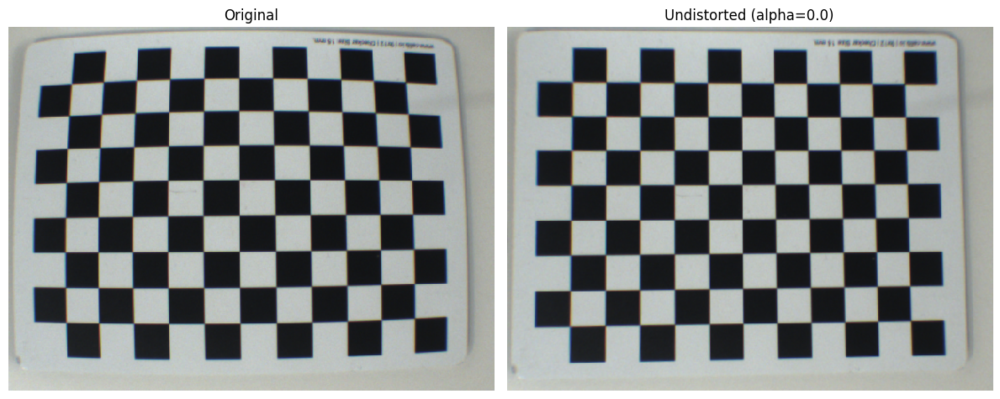

In [270]:
setup_image = cv.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Calibration/final_setup.png')

K = best_calib.K
dist = best_calib.dist

alpha = 0.0
undst_img = undistort_image(setup_image, K, dist, alpha)

orig_rgb = cv.cvtColor(setup_image, cv.COLOR_BGR2RGB)
und_rgb  = cv.cvtColor(undst_img, cv.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(orig_rgb, interpolation='nearest')
axes[0].set_title("Original"); axes[0].axis('off')

axes[1].imshow(und_rgb, interpolation='nearest')
axes[1].set_title(f"Undistorted (alpha={alpha})"); axes[1].axis('off')

plt.tight_layout()
plt.show()



**Calibration of the extrinsic parameters of the camera setup**


In [271]:
rvec, tvec, corners = get_extrinsic_parameters(undst_img, best_calib, chessboard_parameters)
# with rvec: 3x1; tvec: 3x1;  R: 3x3;  [R|t]: 3x4
R, _ = cv.Rodrigues(rvec)
world_to_cam = np.hstack([R, tvec])

print(" -> Extrinsic Matrix: ")
print(world_to_cam)


 -> Extrinsic Matrix: 
[[-0.99781443 -0.01109167 -0.06514096  0.06524178]
 [ 0.00896863 -0.99942189  0.03279402  0.03647397]
 [-0.06546704  0.03213812  0.99733706  0.28527033]]


**Estimation of the pixel-to-millimeter conversion factor**


To estimate the pixel-to-millimeter conversion factor, the average distance between adjacent corners of the calibration chessboard was computed in pixel units. Considering the known physical size of each square, this ratio provides a reliable scale conversion between image measurements and real-world dimensions.

In [272]:
cx = chessboard_parameters.columns_number - 1
cy = chessboard_parameters.rows_number - 1
c = corners.reshape(-1, 2).reshape(cy, cx, 2)
d_h = np.linalg.norm(c[:, 1:] - c[:, :-1], axis=2)
d_v = np.linalg.norm(c[1:] - c[:-1], axis=2)

square_size_mm = chessboard_parameters.square_size_meters * 1000.0
pixel_per_mm = (d_h.mean() + d_v.mean()) / (2 * square_size_mm)

print(f" -> Average ratio (px/mm): {pixel_per_mm:.4f}")

 -> Average ratio (px/mm): 2.9846


With both the intrinsic and extrinsic calibration parameters established, the camera model is now fully defined, enabling its use for accurate metric measurements and object analysis in the Lego image dataset.

---

# **Exercise 2**
>This exercise focuses on analyzing isolated LEGO brick images to extract information about their color, size, and area. A region of interest (ROI) is first defined to isolate the relevant part of each image and remove background noise. The image “colored bricks.png” is then processed to count the number of bricks grouped by color. Subsequently, for the individual color images (“blue.png”, “green.png”, “red.png”, and “yellow.png”), the bricks are grouped by size (e.g., 2x1, 2x2, 2x4), and their average area and standard deviation are calculated in both pixels and square millimeters using the previously obtained pixel-to-millimeter conversion factor. The results are summarized in a table presenting the average area and variability for each brick size and color, providing a quantitative basis for the classification and verification tasks in the following exercises.


### **Assets**

**Color Ranges (HSV)**
> Obtained experimentally with the help of the following site:
https://pseudopencv.site/utilities/hsvcolormask/

In [273]:
COLOR_RANGES = {
  'blue': {
      'light': ([  70, 138,  75], [ 108, 182, 255]),
      'dark':  ([ 108, 172,  75], [ 134, 255, 255]),
  },
  'green': {
      'dark': ([  32, 106,   0], [  68, 255, 255]),
      'light':  ([  32,  81, 125], [  68, 255, 255]),
  },
  'yellow': {
      'light': ([  11, 151, 135], [  29, 255, 255]),
      'dark':  ([  22, 120, 174], [ 180, 255, 255]),
  },
  'red': {
      'light': ([   0, 170,  75], [  10, 255, 255]),
      'dark':  ([ 170, 170,  75], [ 180, 255, 255]),
  },
}

**Available Brick's Colors (BGR)**

In [274]:
# This is just used to match the colors of the brick and the contour (aesthetic reasons)
BRICK_COLORS = {
    "blue":   (255, 0, 0),
    "green":  (0, 255, 0),
    "yellow": (0, 255, 255),
    "red":    (0, 0, 255),
    "white":  (255, 255, 255),
}

**Brick's Shape Information used to the Classification task**

In [275]:
# in mm^2 (w*h)
BRICK_SIZES = {
  '2x1':  32*15,
  '2x2':  32*32,
  '2x4':  32*64,
  '2x6':  32*95,
  'R2x2': 32*47,
}

BRICK_RATIOS = {
    "2x1": 32 / 15,  # ~2.13
    "2x2": 32 / 32,  # 1.0
    "2x4": 64 / 32,  # 2.0
    "2x6": 95 / 32,  # ~2.97
    "R2x2": 47 / 32  # ~1.47
}

**Relevant Classes:**

To keep the code modular, organized, and easy to extend, an object-oriented programming (OOP) approach was adopted.
Each main concept in the project (e.g. pose, dimension, shape) is represented as a dedicated class, encapsulating both the data and the operations related to it.

* **Pose Class**
> A simple class designed to modularly represent the centroids of detected objects.

In [276]:
@dataclass
class Pose:
  x: float
  y: float

* **Dimension and UnitAwareDimension Classes:**
>The **Dimension** class provides a simple structure to represent the width and height of an object and compute its corresponding area.

  >The **UnitAwareDimension** class extends this concept by maintaining the same dimensional information in both pixels and millimeters, allowing straightforward unit conversion.
  It automatically computes missing values based on a given pixel-to-millimeter ratio, ensuring consistency between metric and image-based measurements.

In [277]:
@dataclass(slots=True)
class Dimension:
    width:  float
    height: float

    @property
    def area(self) -> float:
        return self.width * self.height


class UnitAwareDimension:
  def __init__(self, pixel_per_mm=2.88, width_px=None, height_px=None, width_mm=None, height_mm=None):

    self.pixel_per_mm = pixel_per_mm

    if width_px is not None and width_mm is None:
      width_mm = self.convert_to_mm(width_px)

    if width_mm is not None and width_px is None:
      width_px = self.convert_to_px(width_mm)

    if height_px is not None and height_mm is None:
      height_mm = self.convert_to_mm(height_px)

    if height_mm is not None and height_px is None:
      height_px = self.convert_to_px(height_mm)

    if height_mm is None and height_px is None:
      raise ValueError("Invalid height")
    if width_mm is None and width_px is None:
      raise ValueError("Invalid width")

    self.px = Dimension(width_px, height_px)
    self.mm = Dimension(width_mm, height_mm)


  def convert_to_mm(self, px):
    return (px / self.pixel_per_mm)

  def convert_to_px(self, mm):
    return (mm * self.pixel_per_mm)

* **BoxShape Class**
> This class assumes that each LEGO brick can be represented by a simple box shape surrounding its contour.
It computes the box geometry, its dimensions in pixels and millimeters (with the help of the **UnitAwareDimension** class), and the position of the centroid for each detected brick.

In [278]:
class BoxShape:
  def __init__(self, contour):
    self.contour = contour
    self.rect, self.box_points = self.compute_box()
    self.dimension = self.compute_dimensions()
    self.centroid  = self.compute_centroid()

  def compute_box(self):
    rect = cv.minAreaRect(self.contour)
    box_points = cv.boxPoints(rect).astype(int)
    return rect, box_points

  def compute_dimensions(self):
    (w, h) = self.rect[1]
    return UnitAwareDimension(width_px=w, height_px=h, pixel_per_mm=pixel_per_mm)

  def compute_centroid(self):
    M = cv.moments(self.contour)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    return Pose(cx, cy)


* **LegoBrick Class**
>Represents a single LEGO brick with its ID, color, size class, and shape information.




In [279]:
@dataclass
class LegoBrick:
    id: Optional[int] = None
    color: Optional[str] = None
    size_class: Optional[str] = None
    shape: Optional["BoxShape"] = None

* **MultiFormat Class**

  >This class stores different color representations of the same image (BGR, RGB, HSV, and grayscale) to simplify later image processing tasks. It automatically generates the missing formats from the provided one, ensuring that all standard color spaces are readily available.

In [280]:
class MultiFormat:
    def __init__(self, *, bgr=None, rgb=None, hsv=None, gray=None):

        inputs = [bgr, rgb, hsv, gray]
        num_inputs = sum(x is not None for x in inputs)

        if num_inputs > 1:
            raise ValueError("Provide just one image format")

        if bgr is not None:
            self.bgr = bgr
        elif rgb is not None:
            self.bgr = cv.cvtColor(rgb, cv.COLOR_RGB2BGR)
        elif hsv is not None:
            self.bgr = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
        elif gray is not None:
            self.bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

        self.rgb  = cv.cvtColor(self.bgr, cv.COLOR_BGR2RGB)
        self.hsv  = cv.cvtColor(self.bgr, cv.COLOR_BGR2HSV)
        self.gray = cv.cvtColor(self.bgr, cv.COLOR_BGR2GRAY)

* **Image Class**
>This is the main class of the project, responsible for handling all image-level operations.
>
>It uses several of the previously defined classes, namely **MultiFormat** (for storing the image in different color spaces), **BoxShape** (for describing the geometric shape of each brick), **LegoBrick** (for representing individual bricks) and **UnitAwareDimension** (for handling measurements in both pixels and millimeters).
>
>The class builds color masks, extracts contours, and creates LegoBrick objects containing each brick's geometry, size class, and centroid. It also includes visualization tools (show_bricks) and a method to generate a rectangular region of interest (ROI) that isolates the detected bricks from the background.
>
>In addition, a dedicated pipeline is implemented for detecting white bricks, combining HSV thresholding, Hough circle detection of studs, and DBSCAN clustering to identify and group them accurately.
>
>Since this class is quite extensive, We will explain its methods as they are used.

In [281]:
class Image:
  def __init__(self, name, multiformat_image: MultiFormat):
    self.name = name
    self.formats = multiformat_image
    self.bricks: list[LegoBrick] = [] # Initialize bricks before calling get_masks
    self.masks = self.get_masks()


  # ===== Contour's Detection and Drawing =====
  def get_contours(self, mask, min_area=4000, preprocess=False):
    if preprocess:
        mask = cv.medianBlur(mask, 5)
        kernel = np.ones((5, 5), np.uint8)
        mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel)

    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    kept = []
    for cnt in contours:
      area = cv.contourArea(cnt)
      if area >= float(min_area):
          kept.append(cnt)
    return kept


  # ========== General Masks Computation (except White) ===========
  def get_masks(self):

      hsv = self.formats.hsv
      masks = {
          'blue': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['blue']['light'][0]), np.array(COLOR_RANGES['blue']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['blue']['dark'][0]),  np.array(COLOR_RANGES['blue']['dark'][1]))
          ),

          'green': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['green']['light'][0]), np.array(COLOR_RANGES['green']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['green']['dark'][0]),  np.array(COLOR_RANGES['green']['dark'][1]))
          ),

          'yellow': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['yellow']['light'][0]), np.array(COLOR_RANGES['yellow']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['yellow']['dark'][0]),  np.array(COLOR_RANGES['yellow']['dark'][1]))
          ),

          'red': cv.bitwise_or(
              cv.inRange(hsv, np.array(COLOR_RANGES['red']['light'][0]), np.array(COLOR_RANGES['red']['light'][1])),
              cv.inRange(hsv, np.array(COLOR_RANGES['red']['dark'][0]),  np.array(COLOR_RANGES['red']['dark'][1]))
          ),
      }

      return masks


  # ========== Bricks Computations ==========
  def classify_by_size(self, brick):
      w, h = brick.shape.rect[1]
      if w == 0 or h == 0:
          return "unknown"

      ratio = max(w, h) / min(w, h)

      best_class = min(BRICK_RATIOS, key=lambda k: abs(ratio - BRICK_RATIOS[k]))

      if best_class == "2x1" or  best_class == "2x4":
        area_mm = brick.shape.dimension.mm.area
        area_ref_2x1 = BRICK_SIZES["2x1"]

        scaling_factor = 2.0

        if area_mm > (area_ref_2x1 * scaling_factor):
          best_class = "2x4"
        else:
          best_class = "2x1"

      return best_class


  def build_bricks(self, *, min_area=600.0, preprocess=False):
    self.bricks = []
    next_id = 1

    for color, mask in self.masks.items():
      contours = self.get_contours(mask=mask, min_area=min_area, preprocess=preprocess)
      for cnt in contours:
        shape = BoxShape(cnt)
        brick = LegoBrick(id=next_id, color=color, size_class="unknown", shape=shape)
        brick.size_class = self.classify_by_size(brick)
        self.bricks.append(brick)
        next_id += 1
    white_mask = self.white_mask_via_studs()
    self.masks["white"] = white_mask

    return self.bricks


  def show_bricks(self, *, id_show: bool = False, centroid_show: bool = False):

      out = self.formats.bgr.copy()

      for brick in self.bricks:
          box = brick.shape.box_points
          color = BRICK_COLORS.get(brick.color, (0, 255, 0))
          cv.drawContours(out, [box], -1, color, 2)

          cx, cy = int(brick.shape.centroid.x), int(brick.shape.centroid.y)

          if id_show:
              cv.putText(out, str(brick.id), (cx + 5, cy - 5), cv.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2, cv.LINE_AA)

          if centroid_show:
              cv.circle(out, (cx, cy), 3, (0, 0, 255), -1)

      plt.imshow(cv.cvtColor(out, cv.COLOR_BGR2RGB))
      plt.title(f"{self.name}")
      plt.axis("off")
      plt.show()

      return out


  def get_roi(self):
    if not self.bricks:
        raise RuntimeError("Run build_bricks(...) before get_roi().")

    h, w = self.formats.bgr.shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)

    for brick in self.bricks:
        pts = brick.shape.box_points.reshape(-1, 1, 2).astype(np.int32)
        cv.fillPoly(mask, [pts], 255)

    roi = cv.bitwise_and(self.formats.bgr, self.formats.bgr, mask=mask)
    return roi


  # ====== White Bricks Detection Pipeline ======

  def white_hsv_mask(self):
      hsv = self.formats.hsv
      hsv_low = (0, 0, 0)
      hsv_high = (180, 86, 255)
      mask = cv.inRange(hsv, np.array(hsv_low, np.uint8), np.array(hsv_high, np.uint8))
      k = np.ones((3, 3), np.uint8)
      mask = cv.morphologyEx(mask, cv.MORPH_OPEN, k, iterations=1)
      mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, k, iterations=1)
      return mask


  def gray_for_hough(self, mask):
      gray_full = cv.cvtColor(self.formats.bgr, cv.COLOR_BGR2GRAY)
      gray = cv.bitwise_and(gray_full, gray_full, mask=mask)
      gray_blur = cv.GaussianBlur(gray, (3, 3), 0.5)
      return gray_blur

  # Reference: https://www.geeksforgeeks.org/python/circle-detection-using-opencv-python/
  def detect_studs_hough(self, gray_blur, dp=1.0, minDist=20, param1=100, param2=15,minRadius=8, maxRadius=12):
      circles = cv.HoughCircles(
          gray_blur, cv.HOUGH_GRADIENT, dp=dp, minDist=minDist,
          param1=param1, param2=param2,
          minRadius=minRadius, maxRadius=maxRadius
      )
      studs = []
      if circles is not None:
          circles = np.uint16(np.around(circles))
          for x, y, r in circles[0, :]:
              studs.append((int(x), int(y)))
      return np.array(studs, np.float32) if studs else np.empty((0, 2), np.float32)


  def cluster_studs_dbscan(self, stud_centers, eps=60, min_samples=2):
      if len(stud_centers) == 0:
          return np.array([], int), []
      labels = DBSCAN(eps=eps, min_samples=min_samples).fit(stud_centers).labels_
      unique = []
      for l in np.unique(labels):
          if l != -1:
              unique.append(l)
      return labels, unique


  def expand_polygon(self, pts, scale=1.85):
      c = np.mean(pts, axis=0)
      expanded = c + (pts - c) * scale
      return expanded.astype(int)


  def create_white_bricks_from_clusters(self, stud_centers, labels, unique_labels, expand_scale=1.85, next_id_start=1):
      new_bricks = []
      polys = []
      next_id = next_id_start
      for l in unique_labels:
          pts = stud_centers[labels == l]
          c = np.mean(pts, axis=0)
          ang = np.arctan2(pts[:, 1] - c[1], pts[:, 0] - c[0])
          ordered = pts[np.argsort(ang)]
          poly = self.expand_polygon(ordered, scale=expand_scale)
          cnt = poly.reshape(-1, 1, 2).astype(np.int32)
          shape = BoxShape(cnt)
          brick = LegoBrick(id=next_id, color="white", size_class="unknown", shape=shape)
          brick.size_class = self.classify_by_size(brick)
          new_bricks.append(brick)
          polys.append(poly)
          next_id += 1
      return new_bricks, polys, next_id

  # Main function of the pipeline
  def white_mask_via_studs(self,
      hough_dp=1.0,
      hough_minDist=20,
      hough_param1=100,
      hough_param2=15,
      hough_minRadius=8,
      hough_maxRadius=12,
      expand_scale=1.85):

      mask = self.white_hsv_mask()
      gray_blur = self.gray_for_hough(mask)
      studs = self.detect_studs_hough( gray_blur, dp=hough_dp, minDist=hough_minDist, param1=hough_param1, param2=hough_param2, minRadius=hough_minRadius, maxRadius=hough_maxRadius)
      labels, unique = self.cluster_studs_dbscan(studs, eps=60, min_samples=2)
      next_id = (max([b.id for b in self.bricks]) + 1) if self.bricks else 1
      new_bricks, polys, _ = self.create_white_bricks_from_clusters(
          studs, labels, unique,
          expand_scale=expand_scale, next_id_start=next_id)
      self.bricks.extend(new_bricks)
      return mask


  # ========== Bricks Managing Methods ==========

  def add_brick(self, brick: LegoBrick):
    self.bricks.append(brick)


  def initialize_bricks(self):
    self.bricks = []


  def get_bricks_by_color(self, color):
    result = []
    for brick in self.bricks:
        if brick.color == color:
            result.append(brick)
    return result


  def get_bricks_by_size(self, size_class):
    result = []
    for brick in self.bricks:
        if brick.size_class == size_class:
            result.append(brick)
    return result


  def get_bricks_by_color_and_size(self, color, size_class):
    result = []
    for brick in self.bricks:
        if brick.color == color and brick.size_class == size_class:
            result.append(brick)
    return result

###**Setup**

The isolated images are first undistorted using the calibrated intrinsic matrix and distortion coefficients.
Each undistorted image is wrapped in a MultiFormat object and then in an Image instance.
We immediately call build_bricks() wich detects and initializes all LEGO bricks present in the image.
For each color mask, it extracts the external contours, computes a bounding box (BoxShape), and creates a corresponding LegoBrick object with its color, geometry, and size class.

```
  def build_bricks(self, *, min_area=600.0, preprocess=False):
    self.bricks = []
    next_id = 1

    for color, mask in self.masks.items():
      contours = self.get_contours(mask=mask, min_area=min_area, preprocess=preprocess)
      for cnt in contours:
        shape = BoxShape(cnt)
        brick = LegoBrick(id=next_id, color=color, size_class="unknown", shape=shape)
        brick.size_class = self.classify_by_size(brick)
        self.bricks.append(brick)
        next_id += 1
    white_mask = self.white_mask_via_studs()
    self.masks["white"] = white_mask

    return self.bricks
```

**Submethods used in build_bricks():**

* **get_contours(mask, min_area, preprocess)**

  >Detects the external contours in each HSV-based color mask, which is generated to segment the LEGO bricks according to their hue and saturation values.
  To improve segmentation, we apply median blurring and morphological closing to reduce noise and merge fragmented regions, as some LEGO pieces were initially split into multiple contours due to lighting variations.
  Only contours larger than the specified minimum area are retained.

* **classify_by_size(brick)**

  >Determines the most likely brick size class (e.g., 2x1, 2x2, 2x4) by comparing its width/height ratio and estimated area against predefined reference values. Since the 2x1 and 2x4 ratio is really close to each other, we also have a tie-breaking criteria wich is a defined area threshold.

* **white_mask_via_studs()**

  >The white LEGO bricks present a particular challenge because their color is very similar to that of the background, making it difficult to separate them using standard color thresholding.
  >
  >Since we were unable to find a color mask that could simultaneously isolate the white LEGO bricks from both the background and the other colored pieces, we were forced to explore alternative approaches.
  Among the methods tested, we would like to highlight the use of Canny edge detection, which showed some potential when combined with proper preprocessing. Although the results were not fully satisfactory, we believe that, with more time, we could have fine-tuned the threshold values and preprocessing parameters (e.g., brightness and saturation adjustments) to achieve better outcomes.
  >
  >Given these limitations, we developed a dedicated pipeline specifically for white-brick segmentation. The idea is to detect the studs (the circular bumps on top of the bricks), which are the most stable features in these detections. This is achieved using the HoughCircles function. Once the studs are detected, we group them using a clustering algorithm called DBSCAN.
  >
  >At this stage, we considered using K-Means, partly because we had discussed and implemented it in previous courses. However, since DBSCAN does not require specifying the number of clusters in advance (whereas K-Means does), we opted for DBSCAN instead (even though techniques such as the elbow method can estimate the optimal number of clusters for K-Means).
  >
  >After clustering, we assume that the studs belonging to the same group correspond to a single LEGO brick. We then form a virtual connection between the adjacent studs, generating a quadrilateral that lies inside and parallel to the actual brick edges. Finally, this inner quadrilateral is scaled outward using a constant scale factor to approximate the brick's full outline.
  >
  >Although this method performed well in this exercise, where both white bricks were of type 2x2, it is clearly not fully generalizable, as it depends exclusively on the number and arrangement of studs to infer the brick's contour. For example, it would misclassify an R2x2 brick as a standard 2x2 brick, as we will demonstrate in Exercise 4.
  >
  >Nevertheless, we consider this approach robust and sufficiently accurate for most practical cases within the current dataset, particularly for standard brick types such as 2x1, 2x2, 2x4, and 2x6.


In [282]:
isolated_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Isolated'
isolated_original_images = sorted(glob.glob(isolated_images_folder + '/*.png'))

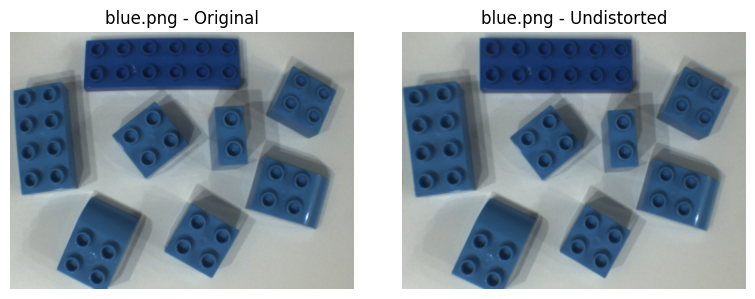

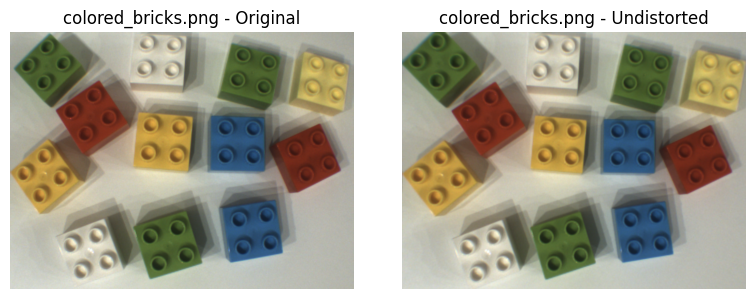

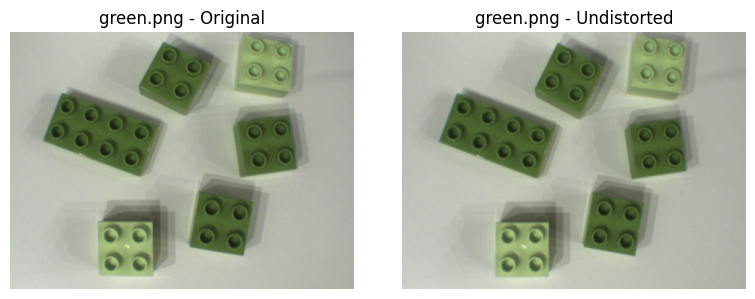

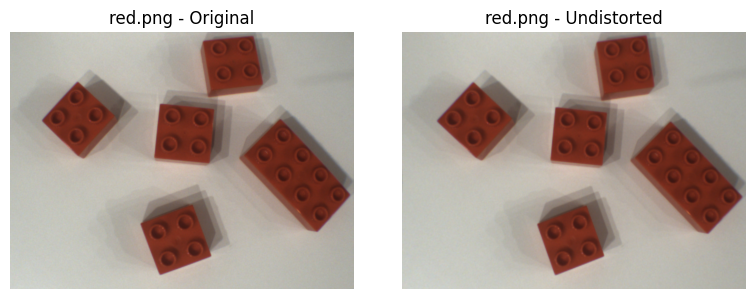

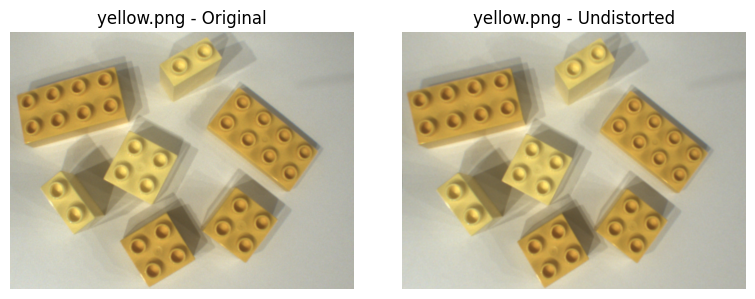

In [283]:
plot_isolated_setup = True

isolated_undistorted_images = []
for image_path in isolated_original_images:

  img = cv.imread(image_path)
  undst_img = undistort_image(img, K, dist, alpha)
  image_name = Path(image_path).name
  isolated_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

# Fill the bricks list
for img in isolated_undistorted_images:
  img.build_bricks(min_area = 4000.0, preprocess = True)

if plot_isolated_setup:
  for i, path in enumerate(isolated_original_images):
    orig_rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    und_rgb  = isolated_undistorted_images[i].formats.rgb
    image_name = Path(path).name

    plt.figure(figsize=(8,3))
    plt.subplot(1,2,1); plt.imshow(orig_rgb); plt.title(f"{image_name} - Original"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(und_rgb);  plt.title(f"{image_name} - Undistorted"); plt.axis('off')
    plt.tight_layout(); plt.show()



### **(a) - Region of Interest (ROI) Definition**

>Identification and selection of a specific region within the image that contains the LEGO bricks, excluding irrelevant background areas.

The **get_roi**() method generates a region of interest (ROI) by masking out the background and keeping only the areas corresponding to the detected LEGO bricks.

```
  def get_roi(self):
    if not self.bricks:
        raise RuntimeError("Run build_bricks(...) before get_roi().")

    h, w = self.formats.bgr.shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)

    for brick in self.bricks:
        pts = brick.shape.box_points.reshape(-1, 1, 2).astype(np.int32)
        cv.fillPoly(mask, [pts], 255)

    roi = cv.bitwise_and(self.formats.bgr, self.formats.bgr, mask=mask)
    return roi
```
It uses the previously computed rectangular contours (box_points) from each brick, fills them to create a binary mask, and then applies this mask to the original image.
This method therefore assumes that the contours have already been generated which occurs during the execution of build_bricks().


>**Note:** We chose not to include the lateral faces of the LEGO bricks in the ROI, as our main goal is to analyze color and dimensions, and the sides do not provide relevant information for these tasks.
However, they could be easily incorporated by creating a dedicated mask for the lateral regions, since they are simply darker shades of the same color already considered in the segmentation process.


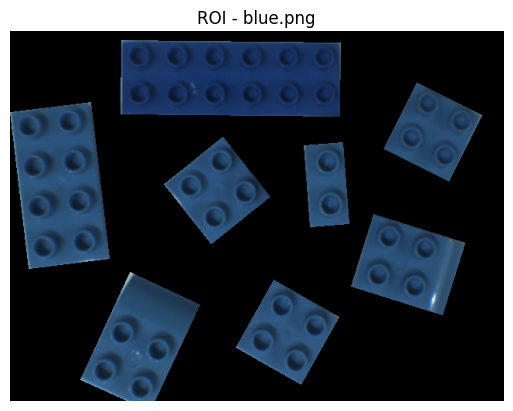

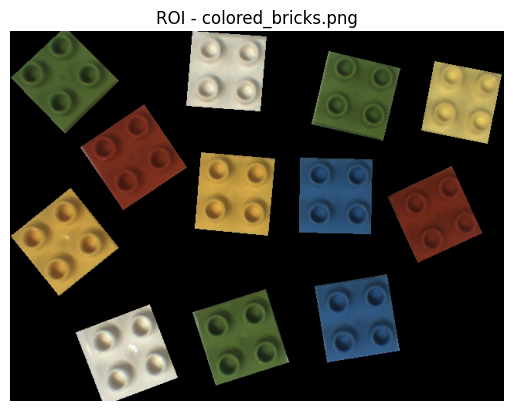

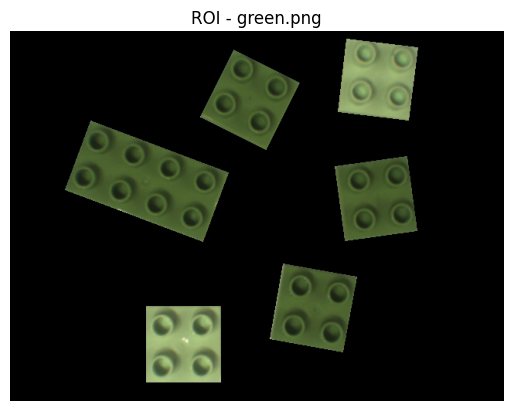

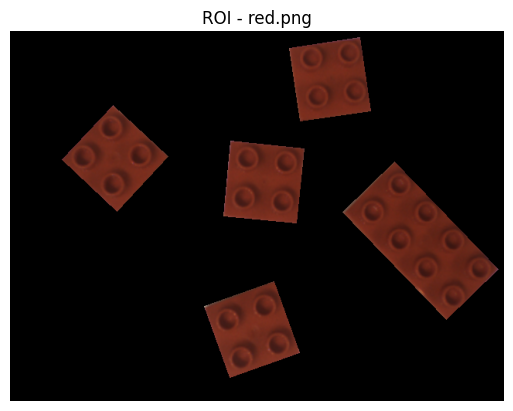

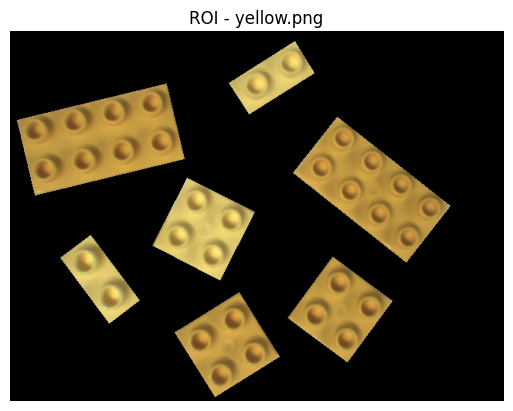

In [284]:
for img in isolated_undistorted_images:
  roi = img.get_roi()

  # Plot
  plt.imshow(cv.cvtColor(roi, cv.COLOR_BGR2RGB))
  plt.title(f"ROI - {img.name}")
  plt.axis("off")
  plt.show()

### **(b) - Brick Color Counting**

> Detection and counting of LEGO bricks in the image “colored bricks.png”, grouping them according to their color categories.

At this stage, all processing steps have already been completed, so we use the **show_bricks**() method to visualize the detected LEGO bricks by drawing their bounding boxes directly on the image.
Each brick contour (box_points) is outlined using its corresponding color, defined in the BRICK_COLORS dictionary.
Optionally, the method can also display the brick IDs and centroids, which can be activated through the parameters id_show and centroid_show.


**show_bricks():**
```
  def show_bricks(self, *, id_show: bool = False, centroid_show: bool = False):

      out = self.formats.bgr.copy()

      for brick in self.bricks:
          box = brick.shape.box_points
          color = BRICK_COLORS.get(brick.color, (0, 255, 0))
          cv.drawContours(out, [box], -1, color, 2)

          cx, cy = int(brick.shape.centroid.x), int(brick.shape.centroid.y)

          if id_show:
              cv.putText(out, str(brick.id), (cx + 5, cy - 5), cv.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2, cv.LINE_AA)

          if centroid_show:
              cv.circle(out, (cx, cy), 3, (0, 0, 255), -1)

      plt.imshow(cv.cvtColor(out, cv.COLOR_BGR2RGB))
      plt.title(f"{self.name}")
      plt.axis("off")
      plt.show()

      return out
```

For the counting part, we iterate through each processed image and use the **get_bricks_by_color**() method to retrieve a list with all detected bricks of a specific color, then we just print it's lenght.

**get_bricks_by_color():**
```
  def get_bricks_by_color(self, color):
    result = []
    for brick in self.bricks:
        if brick.color == color:
            result.append(brick)
    return result
```



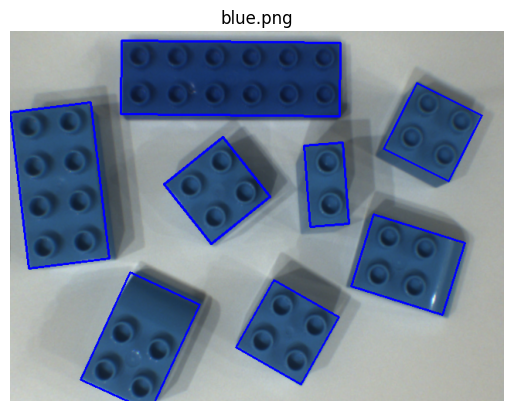

,blue,green,yellow,red,white
Image,,,,,
blue.png,8,0,0,0,0


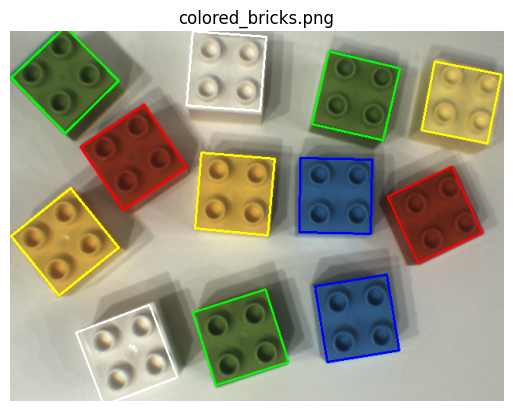

,blue,green,yellow,red,white
Image,,,,,
colored_bricks.png,2,3,3,2,2


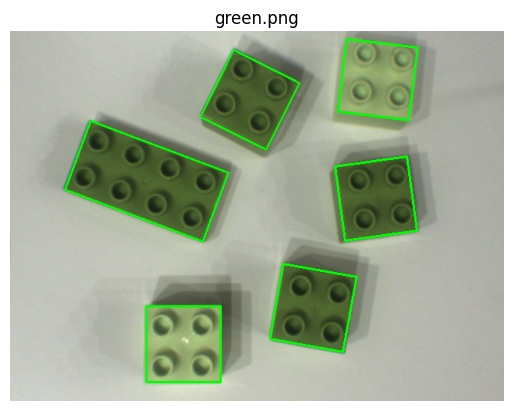

,blue,green,yellow,red,white
Image,,,,,
green.png,0,6,0,0,0


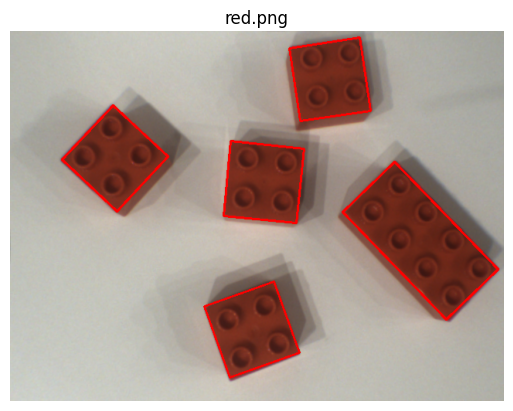

,blue,green,yellow,red,white
Image,,,,,
red.png,0,0,0,5,0


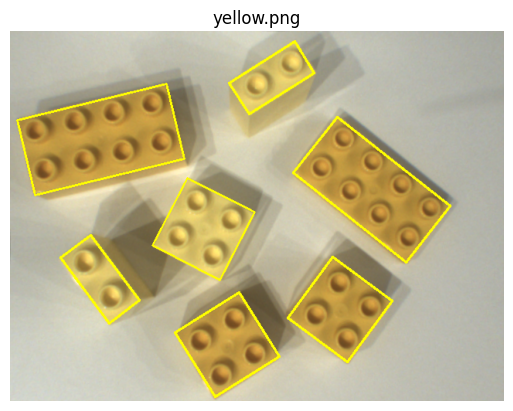

,blue,green,yellow,red,white
Image,,,,,
yellow.png,0,0,7,0,0


In [285]:
for img in isolated_undistorted_images:

    img.show_bricks(id_show=False, centroid_show=False)

    row = {"Image": img.name}
    for color in BRICK_COLORS:
        row[color] = len(img.get_bricks_by_color(color))

    df_img = pd.DataFrame([row]).set_index("Image")
    display(df_img)
    print("")
    print("")


###**(c) - Size Grouping and Area Measurement**

> Classification of LEGO bricks by size from the images “blue.png”, “green.png”, “red.png”, and “yellow.png”, followed by the computation of the average area and standard deviation for each size in millimeters

Here we classify the detected LEGO bricks by size and compute their average area and standard deviation, both in pixels and millimeters.

For each image, we extract the brick dimensions and area from the UnitAwareDimension class, which stores these values in both unit systems (px and mm). The area and size information are then aggregated by the size class (e.g., 2x1, 2x2, 2x4), allowing us to calculate statistical summaries for each group.

Finally, the show_bricks() method is called again (with id_show=True) to visually confirm the brick labeling and ensure that each identified size matches the corresponding physical LEGO piece.

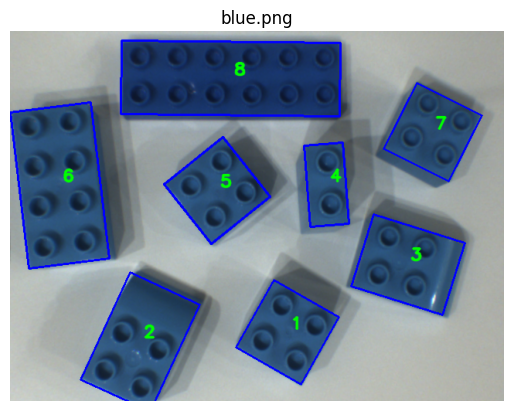

,Size,Count,IDs,Avg_Width_px,Avg_Width_mm,Avg_Height_px,Avg_Height_mm,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm,Image
0,2x1,1,4,105.33,35.290001,49.77,16.680000,5242.12,588.479980,NaN,blue.png
1,2x2,3,"1, 5, 7",96.18,32.230000,97.63,32.709999,9391.93,1054.339966,39.970001,blue.png
2,2x4,1,6,203.30,68.120003,104.75,35.099998,21295.59,2390.649902,NaN,blue.png
3,2x6,1,8,283.53,95.000000,95.21,31.900000,26993.61,3030.310059,NaN,blue.png
4,R2x2,2,"2, 3",111.32,37.299999,124.73,41.790001,13542.05,1520.229980,246.309998,blue.png


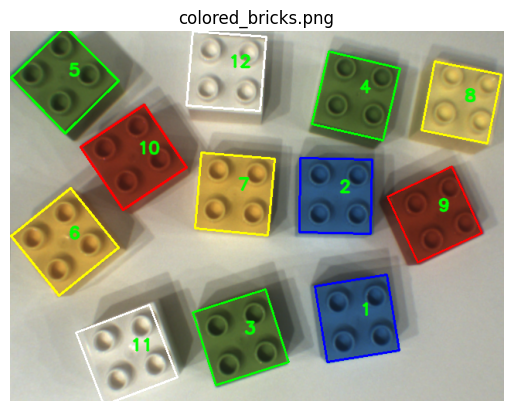

,Size,Count,IDs,Avg_Width_px,Avg_Width_mm,Avg_Height_px,Avg_Height_mm,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm,Image
0,2x2,12,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12",96.31,32.27,96.47,32.32,9298.72,1043.880005,67.540001,colored_bricks.png


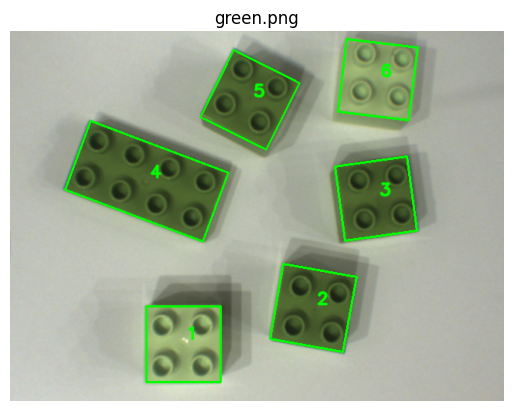

,Size,Count,IDs,Avg_Width_px,Avg_Width_mm,Avg_Height_px,Avg_Height_mm,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm,Image
0,2x2,5,"1, 2, 3, 5, 6",95.53,32.009998,95.90,32.130001,9160.68,1028.380005,30.18,green.png
1,2x4,1,4,190.28,63.750000,95.25,31.910000,18124.75,2034.689941,NaN,green.png


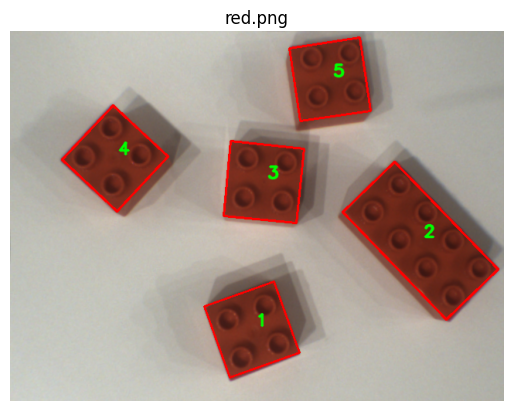

,Size,Count,IDs,Avg_Width_px,Avg_Width_mm,Avg_Height_px,Avg_Height_mm,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm,Image
0,2x2,4,"1, 3, 4, 5",96.39,32.299999,95.1,31.860001,9166.92,1029.079956,28.870001,red.png
1,2x4,1,2,193.15,64.720001,93.5,31.330000,18060.00,2027.420044,NaN,red.png


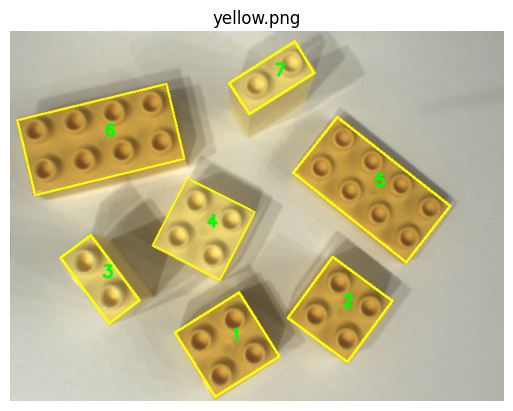

,Size,Count,IDs,Avg_Width_px,Avg_Width_mm,Avg_Height_px,Avg_Height_mm,Avg_Area_px,Avg_Area_mm,Std_Deviation_mm,Image
0,2x1,2,"3, 7",76.99,25.799999,74.51,24.969999,5006.38,562.020020,28.18,yellow.png
1,2x2,3,"1, 2, 4",96.99,32.500000,98.05,32.849998,9510.63,1067.660034,15.78,yellow.png
2,2x4,2,"5, 6",142.75,47.830002,145.18,48.639999,18410.19,2066.729980,202.75,yellow.png




=== GLOBAL SUMMARY ACROSS ALL IMAGES ===



,Size,Total_Count,Avg_Width_mm,Avg_Height_mm,Avg_Area_mm,Std_Deviation_mm
0,2x1,3,30.540001,20.820000,575.250000,18.709999
1,2x2,27,32.259998,32.369999,1044.670044,16.820000
2,2x4,5,61.110001,36.740002,2129.870117,174.690002
3,2x6,1,95.000000,31.900000,3030.310059,NaN
4,R2x2,2,37.299999,41.790001,1520.229980,NaN


In [286]:
global_summaries = []

for img in isolated_undistorted_images:
    rows = []

    for brick in img.bricks:
        area_measured_mm = brick.shape.dimension.mm.area
        width_measured_mm = brick.shape.dimension.mm.width
        height_measured_mm = brick.shape.dimension.mm.height

        area_measured_px = brick.shape.dimension.px.area
        width_measured_px = brick.shape.dimension.px.width
        height_measured_px = brick.shape.dimension.px.height

        rows.append({
            "Image": img.name,
            "ID": brick.id,
            "Size": brick.size_class,
            "Width (px)": width_measured_px,
            "Width (mm)": width_measured_mm,
            "Height (px)": height_measured_px,
            "Height (mm)": height_measured_mm,
            "Measured Area (px)": area_measured_px,
            "Measured Area (mm)": area_measured_mm,
        })

    df = pd.DataFrame(rows)

    summary = (
        df.groupby("Size")
        .agg(
            Count=("ID", "count"),
            IDs=("ID", lambda x: ', '.join(map(str, x))),
            Avg_Width_px=("Width (px)", "mean"),
            Avg_Width_mm=("Width (mm)", "mean"),
            Avg_Height_px=("Height (px)", "mean"),
            Avg_Height_mm=("Height (mm)", "mean"),
            Avg_Area_px=("Measured Area (px)", "mean"),
            Avg_Area_mm=("Measured Area (mm)", "mean"),
            Std_Deviation_mm=("Measured Area (mm)", "std")
        )
        .reset_index()
        .round(2)
    )

    summary["Image"] = img.name
    global_summaries.append(summary)

    img.show_bricks(id_show=True, centroid_show=False)
    plt.show()
    display(summary)
    print()

# Global stats
global_df = pd.concat(global_summaries, ignore_index=True)

global_summary = (
    global_df.groupby("Size")
    .agg(
        Total_Count=("Count", "sum"),
        Avg_Width_mm=("Avg_Width_mm", "mean"),
        Avg_Height_mm=("Avg_Height_mm", "mean"),
        Avg_Area_mm=("Avg_Area_mm", "mean"),
        Std_Deviation_mm=("Avg_Area_mm", "std"),
    )
    .reset_index()
    .round(2)
)

print("\n=== GLOBAL SUMMARY ACROSS ALL IMAGES ===\n")
display(global_summary)


###**Results**

The results obtained from the color segmentation and size classification stages were globally consistent and accurate. All LEGO bricks were correctly identified and assigned to their respective color and size categories without any misclassification.

Regarding the average dimensions and area measurements, small deviations were observed when compared to the theoretical reference values but the result is pretty accurate. These errors can be attributed to several factors inherent to the image acquisition and calibration process. Firstly, the height difference between the LEGO bricks and the chessboard plane used for camera calibration introduces a slight perspective distortion, as the calibration assumes all objects lie on the same plane. Additionally, the pixel-to-millimeter conversion factor may include minor inaccuracies due to real-world sampling errors and spatial discretization when mapping physical distances to pixel units.

Other potential sources of error include imperfections in the intrinsic and extrinsic calibration matrices, as well as the fact that lens distortion correction is never perfectly precise. Despite these limitations, the results remain quantitatively coherent and visually consistent, confirming that the implemented pipeline provides an accurate and robust framework for color and size detection within the analyzed dataset.

Moreover, we can observe that the most accurate size class is the 2x2, with an average width and height of approximately 32.26 mm and 32.37 mm, respectively, compared with the reference value of 32 mm. This high precision is expected, as the 2x2 brick is the most frequent class in the dataset, which statistically reduces measurement variance. Additionally, even in real-world manufacturing, LEGO bricks may exhibit small dimensional tolerances, so perfect alignment with the nominal size is not expected.


---

# **Exercise 3**
>In this exercise, the analysis focuses on complete LEGO kit images, where each image represents a full set of bricks intended for packaging and delivery.
The main objectives are to detect and visualize all bricks, count them by color and size, and identify which predefined kit configuration (Kit 1, Kit 2, or Kit 3) each image corresponds to.

This stage extends the previous work on isolated bricks, applying the same detection and classification pipeline to more complex scenes containing multiple bricks of different colors and sizes.
The resulting counts are then compared against the reference kit specifications to verify completeness and determine the correct kit type.


### **Assets**

**LegoBrickKit Class**
>The LegoBrickKit class represents a predefined LEGO kit configuration, storing the list of bricks that compose a specific set.
It provides methods to count, compare, and validate brick collections against this reference configuration.
>
>The **count_bricks()** method creates a summarized count of all bricks, grouped by color and size class, providing a concise representation of each kit's composition.
>
>The **compare()** method contrasts the reference kit with an input brick collection, identifying missing, extra, and matching elements.
>
>Finally, the **belongs_to_kit()** method determines whether a given set of detected bricks exactly matches the reference kit, returning True only when all required pieces are present and no additional ones are found.

In [287]:
class LegoBrickKit:
    def __init__(self, id, bricks):
        self.id = id
        self.bricks: list[LegoBrick] = bricks

    def count_bricks(self, bricks):
        counts = {}
        for brick in bricks:
            key = (brick.color, brick.size_class)
            counts[key] = counts.get(key, 0) + 1
        return counts

    def compare(self, bricks):
        kit_counts = self.count_bricks(self.bricks)
        img_counts = self.count_bricks(bricks)

        missing, extra, matches = {}, {}, {}

        # Check for missing bricks
        for key, kit_qtt in kit_counts.items():
            img_qtt = img_counts.get(key, 0)
            if img_qtt < kit_qtt:
                missing[key] = kit_qtt - img_qtt
            elif img_qtt > 0:
                matches[key] = min(kit_qtt, img_qtt)

        # Check for extra bricks
        for key, img_qtt in img_counts.items():
            kit_qtt = kit_counts.get(key, 0)
            if img_qtt > kit_qtt:
                extra[key] = img_qtt - kit_qtt

        return {"missing": missing, "extra": extra, "matches": matches}

    def belongs_to_kit(self, bricks):
        cmp = self.compare(bricks)
        return (len(cmp["missing"]) == 0) and (len(cmp["extra"]) == 0)


### **Setup**

**Kits initialization**

In [288]:
# ===================== Kit 1 Initialization ================================
LegoBrickKit_1 = LegoBrickKit(1, [LegoBrick(color="yellow", size_class="2x1"),
                                  LegoBrick(color="yellow", size_class="2x1"),
                                  LegoBrick(color="yellow", size_class="2x4"),
                                  LegoBrick(color="blue",   size_class="R2x2"),
                                  LegoBrick(color="blue",   size_class="R2x2"),
                                  LegoBrick(color="green",  size_class="2x4"),
                                  LegoBrick(color="red",    size_class="2x4"),])


# ===================== Kit 2 Initialization ================================
LegoBrickKit_2 = LegoBrickKit(2, [LegoBrick(color="yellow", size_class="2x2"),
                                  LegoBrick(color="yellow", size_class="2x4"),
                                  LegoBrick(color="blue", size_class="2x1"),
                                  LegoBrick(color="blue",   size_class="2x4"),
                                  LegoBrick(color="blue",   size_class="2x6"),
                                  LegoBrick(color="green",  size_class="2x2"),
                                  LegoBrick(color="red",    size_class="2x2"),])

# ===================== Kit 3 Initialization ================================
LegoBrickKit_3 = LegoBrickKit(3, [LegoBrick(color="yellow", size_class="2x2"),
                                  LegoBrick(color="yellow", size_class="2x2"),
                                  LegoBrick(color="yellow", size_class="2x4"),
                                  LegoBrick(color="blue",   size_class="2x2"),
                                  LegoBrick(color="blue",   size_class="2x6"),
                                  LegoBrick(color="green",  size_class="2x2"),
                                  LegoBrick(color="red",    size_class="2x2"),])
# existant_kits List Creation
existant_kits = []
existant_kits.append(LegoBrickKit_1)
existant_kits.append(LegoBrickKit_2)
existant_kits.append(LegoBrickKit_3)

**Images Upload**

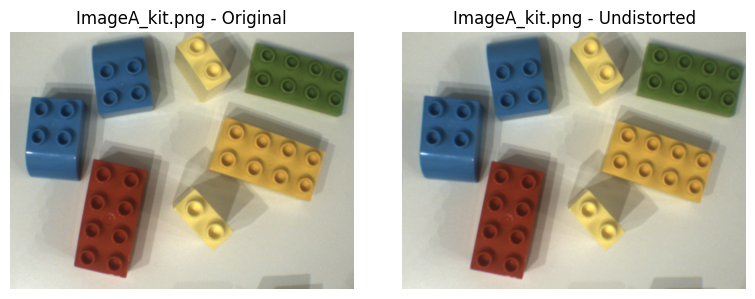

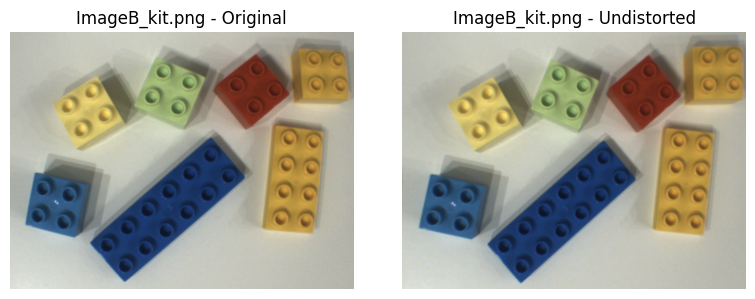

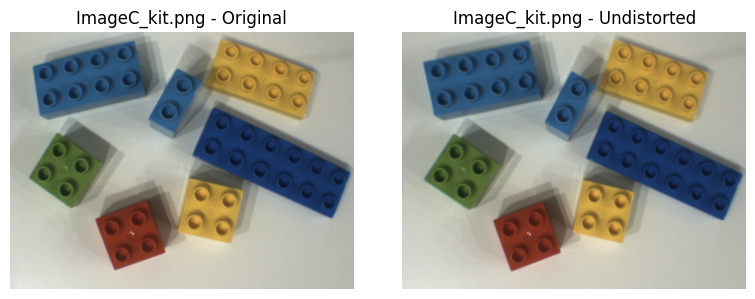

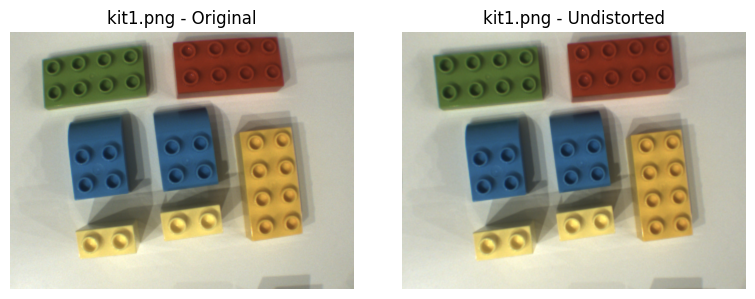

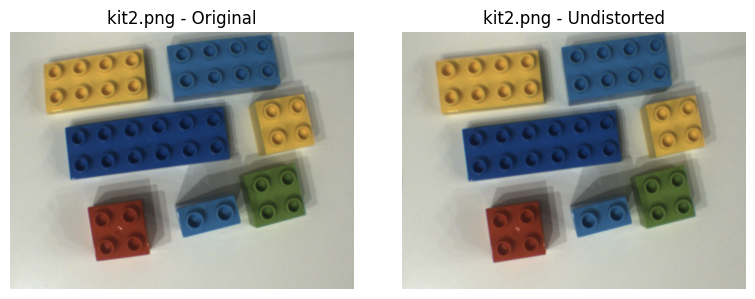

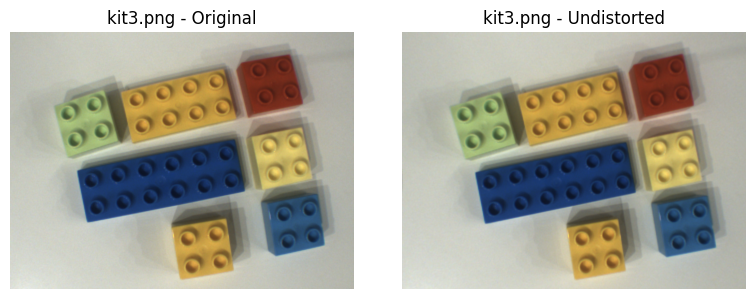

In [289]:
plot_kit_setup = True

kit_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Kit'
kit_original_images = sorted(glob.glob(kit_images_folder + '/*.png'))
kit_undistorted_images = []

for image_path in kit_original_images:

  img = cv.imread(image_path)
  undst_img = undistort_image(img, K, dist, alpha)
  image_name = Path(image_path).name
  kit_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

# Plot
if plot_kit_setup:
  for i, path in enumerate(kit_original_images):
    orig_rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    und_rgb  = kit_undistorted_images[i].formats.rgb
    image_name = Path(path).name

    plt.figure(figsize=(8,3))
    plt.subplot(1,2,1); plt.imshow(orig_rgb); plt.title(f"{image_name} - Original"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(und_rgb);  plt.title(f"{image_name} - Undistorted"); plt.axis('off')
    plt.tight_layout(); plt.show()

###**(a) - Brick Detection and Visualization**

> Show the detected bricks along with the position of their centroids in each image.

The detected LEGO bricks are displayed with their corresponding centroids, using the already mentioned **show_bricks()** method with the parameter **centroid_show=True**.

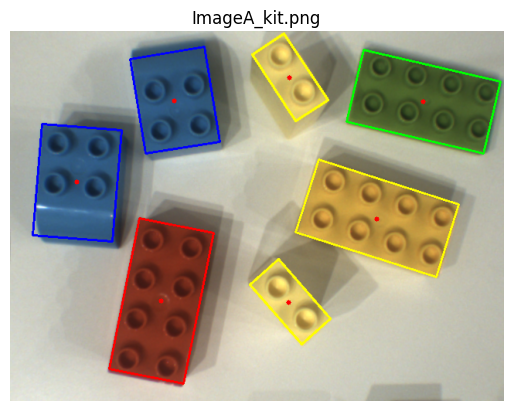

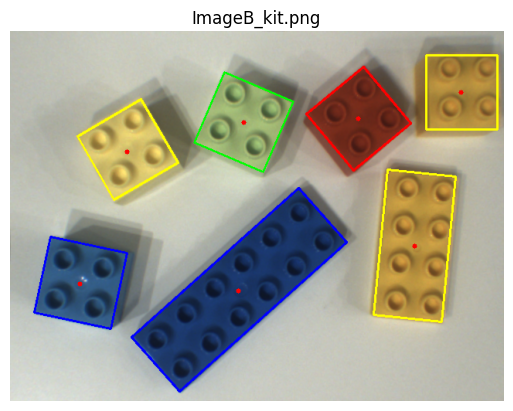

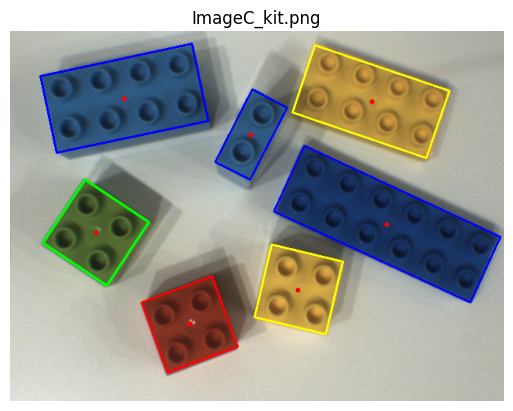

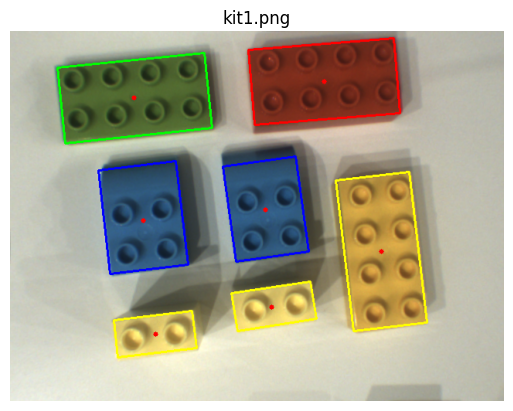

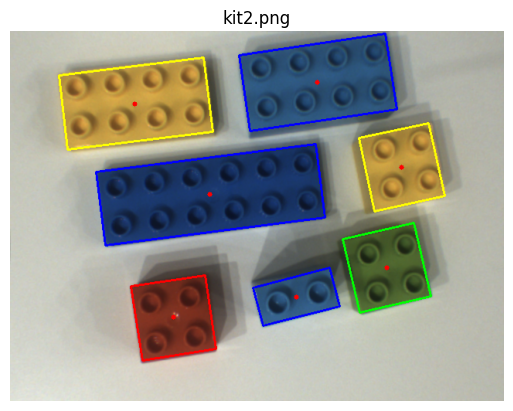

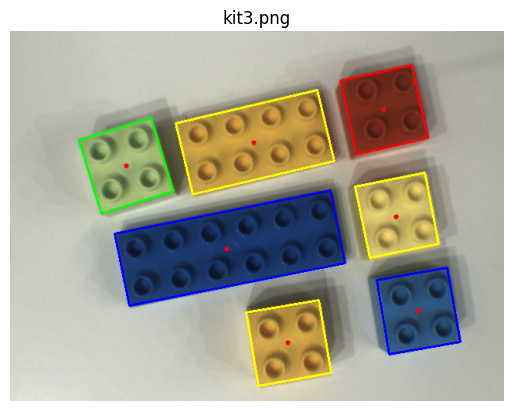

In [290]:
for img in kit_undistorted_images:
    img.build_bricks(min_area = 4000.0, preprocess = True)
    img.show_bricks(id_show=False, centroid_show=True)

### **(b) - Brick Counting by Size and Color**

>Count the number of bricks by size and color for all images.

For each image, the detected bricks are grouped by size class and color, and the corresponding quantities are computed.
This reuses the counting procedure from Exercise 2 (now applied to all kit images) and provides an aggregated view to verify the distribution of bricks across sizes and colors.

In [291]:
rows = []
for img in kit_undistorted_images:
    for brick in img.bricks:
        rows.append({
            "Image": img.name,
            "Size": getattr(brick, "size_class", "Unknown"),
            "Color": getattr(brick, "color", "Unknown"),
        })

df = pd.DataFrame(rows)

summary = (
    df.groupby(["Image", "Size", "Color"])
      .size()
      .reset_index(name="Quantity")
      .sort_values(["Image", "Color", "Size"])
)

summary["_"] = summary.groupby("Image").cumcount()
summary = summary.set_index(["Image", "_"])[["Size", "Color", "Quantity"]]
summary.index.names = [None, None]

display(
    summary.style.set_table_styles([
        {"selector": "th.row_heading.level0",
         "props": [("text-align", "center"), ("vertical-align", "middle")]}
    ]).hide(axis="index", level=1)
)


###**(c) - Kit Identification**

>Determine which pre-defined Lego kit corresponds to each image.

Each image's brick counts (by size and color) are compared against the predefined kit specifications using the LegoBrickKit class.
To perform this comparison, **the belongs_to_kit()** method is used, as previously described.


In [292]:
import pandas as pd

results = []

for img in kit_undistorted_images:
    found = False
    for kit in existant_kits:
        if kit.belongs_to_kit(img.bricks):
            results.append({
                "Image": img.name,
                "Detected Kit": f"Kit {kit.id}",
                "Status": "Match"
            })
            found = True
            break
    if not found:
        results.append({
            "Image": img.name,
            "Detected Kit": "None",
            "Status": "No Match"
        })

df_results = pd.DataFrame(results).set_index("Image")
display(df_results)



,Detected Kit,Status
Image,,
ImageA_kit.png,Kit 1,Match
ImageB_kit.png,Kit 3,Match
ImageC_kit.png,Kit 2,Match
kit1.png,Kit 1,Match
kit2.png,Kit 2,Match
kit3.png,Kit 3,Match


### **(d) - Recommendations for Process Improvement**

>Provide some recommendations that the LEGO factory should take into consideration to improve the performance of the sorting process based on image processing.

The LEGO factory should work on improving the imaging setup, ensuring that the lighting is uniform and evenly distributed to avoid shadows and reflections.
The camera calibration should be performed at the same height as the LEGO pieces, so that both are effectively on the same plane. Finally, using a matte black background would be a good improvement, since there are no black bricks in the analyzed kits and this would reduce glare and provide a strong contrast between the pieces and the background.

### **Results**
All LEGO bricks were correctly identified in terms of both color and size class, demonstrating the robustness of the segmentation and classification methods.
The comparison between the detected bricks and the predefined kit compositions also produced fully accurate results, with each image being correctly matched to its corresponding LEGO kit.
These outcomes confirm the effectiveness of the implemented object detection and classification pipeline, as well as the consistency of the color and geometric features extracted from the processed images.

---

# **Exercise 4**

>In this exercise, the analysis focuses on the Fault image set, which contains LEGO kits that may be incomplete or contain extra or incorrect pieces.
Each image must be assigned to its corresponding predefined kit or classified as a faulty kit if discrepancies are detected.
A kit is considered faulty when it deviates from the reference configuration due to missing or surplus bricks, or the inclusion of elements not specified for that kit.
In such cases, the system should automatically identify and report the cause of the fault.

This stage builds directly upon the previous exercise by applying the same detection and classification framework, now extended with consistency checks to detect configuration errors.
By comparing the detected brick composition (color and size) with the predefined kit specifications, it is possible to automatically flag faults and identify whether they are caused by missing, extra, or incorrectly colored bricks.

### **Setup**

**Kits initialization**

In [293]:
# ===================== Kit A Initialization ================================
LegoBrickKit_A = LegoBrickKit('A', [LegoBrick(color="yellow",  size_class="2x1"),
                                  LegoBrick(color="yellow",  size_class="2x2"),
                                  LegoBrick(color="blue",    size_class="R2x2"),
                                  LegoBrick(color="green",   size_class="2x4"),
                                  LegoBrick(color="red",     size_class="2x2"),
                                  LegoBrick(color="red",     size_class="2x4"),])


# ===================== Kit B Initialization ================================
LegoBrickKit_B = LegoBrickKit('B', [LegoBrick(color="yellow", size_class="2x1"),
                                  LegoBrick(color="yellow", size_class="2x2"),
                                  LegoBrick(color="yellow", size_class="2x4"),
                                  LegoBrick(color="red",   size_class="2x2"),
                                  LegoBrick(color="green", size_class="2x4"),
                                  LegoBrick(color="blue",   size_class="R2x2"),])

# ===================== Kit C Initialization ================================
LegoBrickKit_C = LegoBrickKit('C', [LegoBrick(color="yellow", size_class="2x2"),
                                  LegoBrick(color="yellow", size_class="2x4"),
                                  LegoBrick(color="blue", size_class="2x4"),
                                  LegoBrick(color="blue",   size_class="2x6"),
                                  LegoBrick(color="green",  size_class="2x4"),
                                  LegoBrick(color="red",    size_class="2x4"),])

# existant_kits List Creation
existant_kits2 = []
existant_kits2.append(LegoBrickKit_A)
existant_kits2.append(LegoBrickKit_B)
existant_kits2.append(LegoBrickKit_C)

**Images Upload and Image Class building**

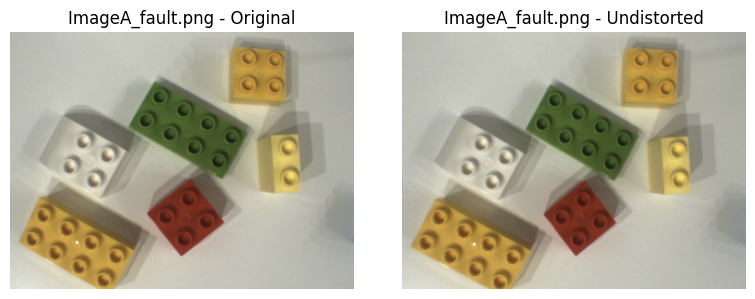

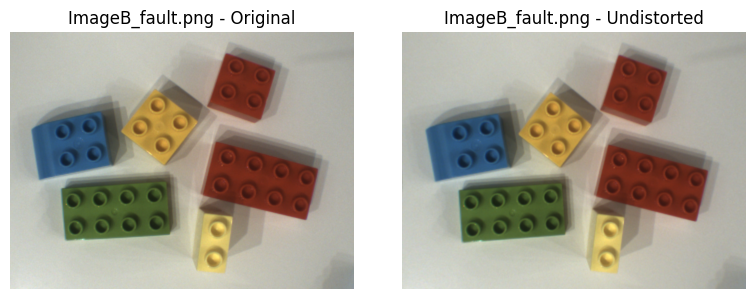

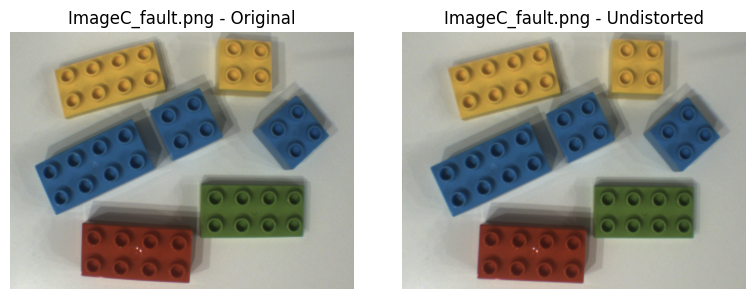

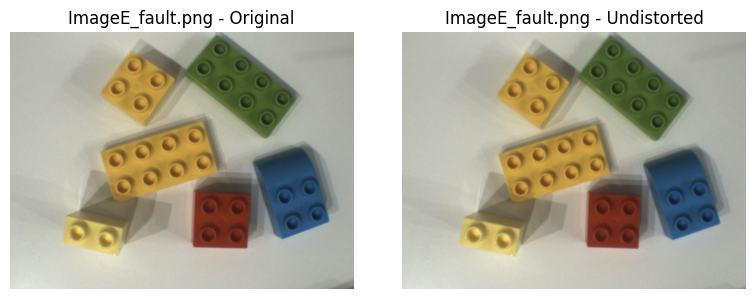

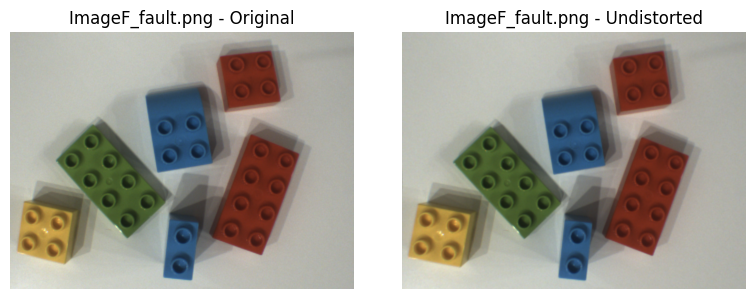

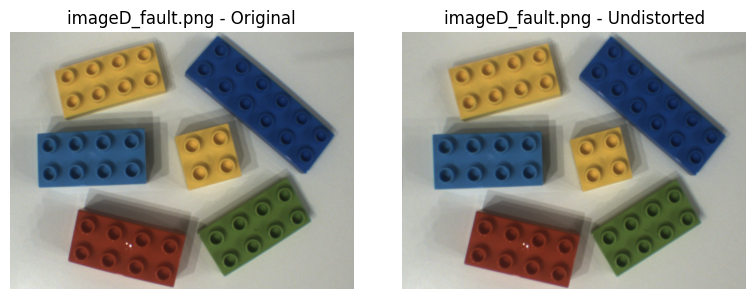

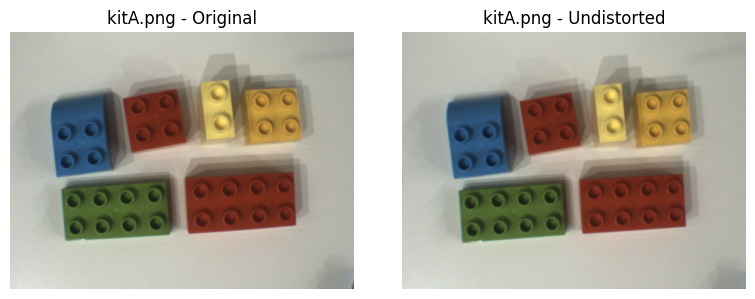

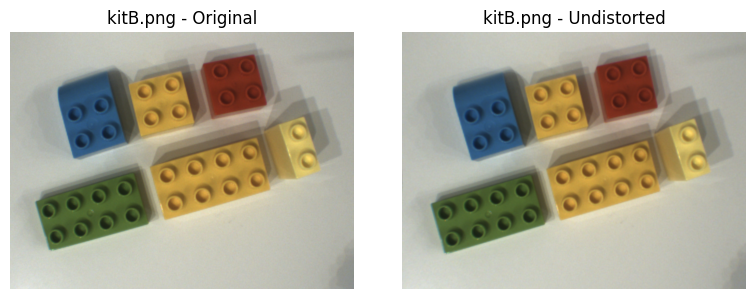

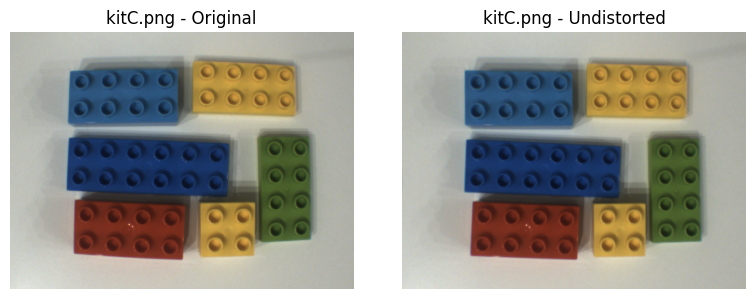

In [294]:
plot_fault_setup = True

fault_images_folder = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Projects/Project_#1/assign1_data/Fault'
fault_original_images = sorted(glob.glob(fault_images_folder + '/*.png'))
fault_undistorted_images = []

for image_path in fault_original_images:

  img = cv.imread(image_path)
  undst_img = undistort_image(img, K, dist, alpha)
  image_name = Path(image_path).name
  fault_undistorted_images.append(Image(image_name, MultiFormat(bgr=undst_img)))

# Plot
if plot_fault_setup:
  for i, path in enumerate(fault_original_images):
    orig_rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    und_rgb  = fault_undistorted_images[i].formats.rgb
    image_name = Path(path).name

    plt.figure(figsize=(8,3))
    plt.subplot(1,2,1); plt.imshow(orig_rgb); plt.title(f"{image_name} - Original"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(und_rgb);  plt.title(f"{image_name} - Undistorted"); plt.axis('off')
    plt.tight_layout(); plt.show()

for img in fault_undistorted_images:
    img.build_bricks(min_area = 4000.0, preprocess = True)

### **Development**
Each fault image is evaluated against the predefined LEGO kit configurations to verify whether its composition matches any valid kit.
The comparison is carried out through the **compare()** method of the LegoBrickKit class, which analyses differences in brick color and size between the detected set and the reference model.
Whenever inconsistencies are found, it identifies and lists the missing and extra pieces, while perfectly matching configurations are labeled as valid kits.

In [295]:

def sort_key(item):
    color = item[0][0]
    size = item[0][1]
    return (color, size)

rows = []

for img in fault_undistorted_images:
    matched = False

    for kit in existant_kits2:
        cmp = kit.compare(img.bricks)

        missing_items = sorted(list(cmp["missing"].items()), key=sort_key)
        extra_items = sorted(list(cmp["extra"].items()), key=sort_key)

        missing_str = ", ".join([f"{q}× {size} {color}" for (color, size), q in missing_items]) if missing_items else "—"
        extra_str = ", ".join([f"{q}× {size} {color}" for (color, size), q in extra_items]) if extra_items else "—"

        if not cmp["missing"] and not cmp["extra"]:
            rows.append({
                "Image": img.name,
                "Kit": kit.id,
                "Status": " Match",
                "Missing": "—",
                "Extra": "—"
            })
            matched = True
            break

        else:
            rows.append({
                "Image": img.name,
                "Kit": kit.id,
                "Status": " Mismatch",
                "Missing": missing_str,
                "Extra": extra_str
            })

    if not matched:
        rows.append({
            "Image": img.name,
            "Kit": "—",
            "Status": " No match found",
            "Missing": "—",
            "Extra": "—"
        })

summary_df = pd.DataFrame(rows)
display(summary_df)


,Image,Kit,Status,Missing,Extra
0,ImageA_fault.png,A,Mismatch,"1× R2x2 blue, 1× 2x4 red, 1× 2x1 yellow","1× 2x2 white, 1× 2x4 yellow"
1,ImageA_fault.png,B,Mismatch,"1× R2x2 blue, 1× 2x1 yellow",1× 2x2 white
2,ImageA_fault.png,C,Mismatch,"1× 2x4 blue, 1× 2x6 blue, 1× 2x4 red","1× 2x2 red, 1× 2x2 white"
3,ImageA_fault.png,—,No match found,—,—
4,ImageB_fault.png,A,Mismatch,1× 2x1 yellow,—
5,ImageB_fault.png,B,Mismatch,"1× 2x1 yellow, 1× 2x4 yellow",1× 2x4 red
6,ImageB_fault.png,C,Mismatch,"1× 2x4 blue, 1× 2x6 blue, 1× 2x4 yellow","1× R2x2 blue, 1× 2x2 red"
7,ImageB_fault.png,—,No match found,—,—
8,ImageC_fault.png,A,Mismatch,"1× R2x2 blue, 1× 2x2 red, 1× 2x1 yellow","2× 2x2 blue, 1× 2x4 blue, 1× 2x4 yellow"
9,ImageC_fault.png,B,Mismatch,"1× R2x2 blue, 1× 2x2 red, 1× 2x1 yellow","2× 2x2 blue, 1× 2x4 blue, 1× 2x4 red"


### **Results**
The classification between faulty and non-faulty kits was entirely correct across all tested images.
The only potential source of error identified was related to the white R2x2 piece, which, as previously discussed, can sometimes be misclassified due to the limitations of the white-brick detection pipeline.
However, this issue was not relevant in the current dataset, since none of the predefined kits contained white pieces.
As a result, simply detecting the color as white was sufficient to ensure correct fault identification in every case.

---
# **References**

[1] https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html

[2] https://docs.opencv.org/4.x/d7/d53/tutorial_py_pose.html

[3] https://fiveko.com/online-tools/hough-circle-detection-demo/

[4] https://pseudopencv.site/utilities/hsvcolormask/

[5] https://www.geeksforgeeks.org/python/circle-detection-using-opencv-python/

[6] https://www.geeksforgeeks.org/machine-learning/implementing-dbscan-algorithm-using-sklearn/

---
